## **Part 2 | Image Stitching**

### This notebook demonstrates the core steps behind creating a panorama using image stitching techniques. We'll implement each component manually, then compare our output with OpenCV's built-in `stitch()` function.

Steps:

1. Detect keypoints and compute descriptors using **SIFT**
2. Match descriptors using **Brute Force Matcher**
3. Compute the **homography matrix** using point correspondences
4. **Warp and blend** the two images to form a mosaic
5. Compare our output with **OpenCV's built-in stitcher**

In [2]:
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt

In [3]:
def display_image(image, title):
    plt.figure(figsize=(10, 5))
    plt.imshow(image)
    plt.title(title)
    plt.axis("off")
    plt.show()

def display_gray_image(image, title):
    plt.figure(figsize=(10, 5))
    plt.imshow(image, cmap='gray')
    plt.title(title)
    plt.axis("off")
    plt.show()

### Step 1: Load and Convert the Images

Here, we load the input images and convert them into both RGB and grayscale versions, as grayscale is required for keypoint detection using SIFT.


In [4]:
image_paths=['assets/stitching/pano_image1.jpg','assets/stitching/pano_image2.jpg'] 

imgs0 = [] 
gray_imgs = []
for i in range(len(image_paths)): 
	imgs0.append(cv.cvtColor(cv.imread(image_paths[i]), cv.COLOR_BGR2RGB)) 
	gray_imgs.append(cv.cvtColor(cv.imread(image_paths[i]), cv.COLOR_BGR2GRAY))  


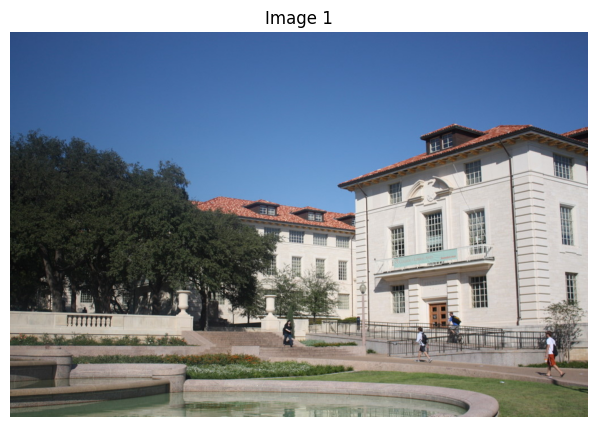

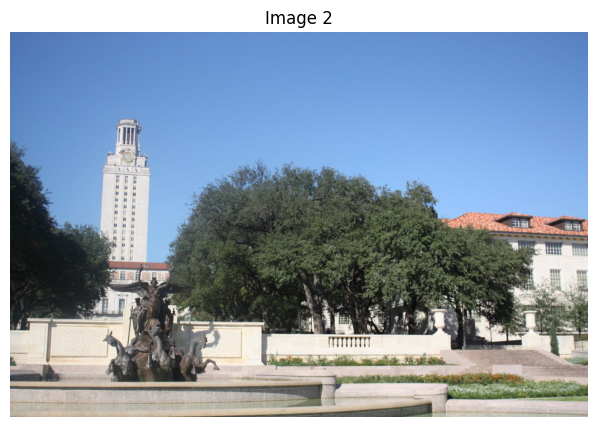

In [5]:
for i in range(len(image_paths)):
    display_image(imgs0[i], f"Image {i+1}")


### Step 2: Detect Keypoints & Descriptors using SIFT

SIFT (Scale-Invariant Feature Transform) is used to detect and compute descriptors for keypoints in the images. These descriptors will later be used for matching keypoints between the images.


In [6]:
# sift = cv2.xfeatures2d.SIFT_create() #old 
# kp1 = sift.detect(gray_imgs[0], None)

sift = cv.SIFT_create()
# kp: leeha x, y, scale, orientation
# des: 128 dimensional vector
kp1, des1 = sift.detectAndCompute(gray_imgs[0], None) #SIFT works best on grayscale images
kp2, des2 = sift.detectAndCompute(gray_imgs[1], None)

img1 = cv.drawKeypoints(gray_imgs[0], kp1, imgs0[0].copy(), flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
img2 = cv.drawKeypoints(gray_imgs[1], kp2, imgs0[1].copy(), flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)


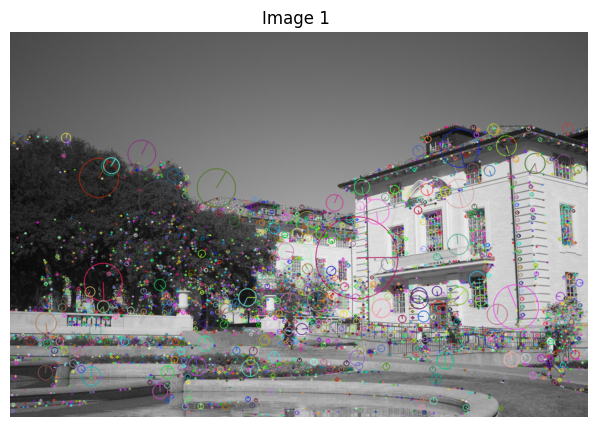

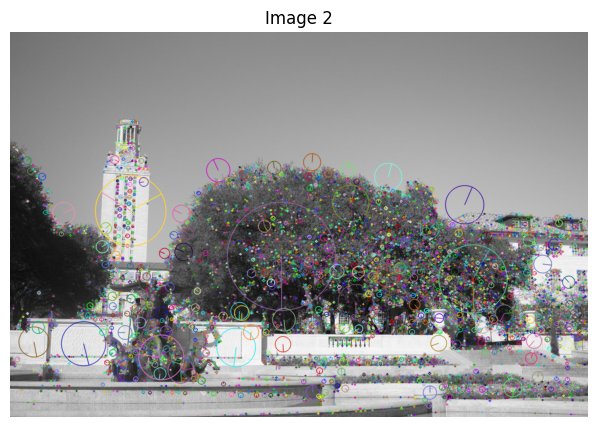

In [7]:
display_image(img1, "Image 1 ")
display_image(img2, "Image 2")

### Step 3: Match Keypoints Using Brute-Force Matcher (with Lowe's Ratio Test)

Then, we match the descriptors between the two images using a brute-force matcher. Lowe's ratio test is applied to filter out weak matches.

- (may try FLANN as well)

In [8]:
bf = cv.BFMatcher()
matches = bf.knnMatch(des1,des2,k=2)

good = []
for m,n in matches:
    if m.distance < 0.5*n.distance:
        good.append([m])

good = sorted(good, key=lambda x: x[0].distance)[:50] #keeping best 50 matches

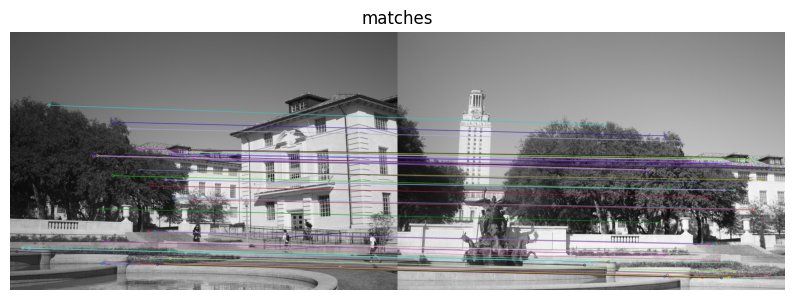

In [9]:
img3 = cv.drawMatchesKnn(gray_imgs[0],kp1,gray_imgs[1],kp2,good,None,flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
display_image(img3, "matches")

### Step 4: Compute Homography Matrix (Manual + OpenCV)

We calculate the homography matrix in two ways:
1. Manually, by solving the system of equations derived from the point correspondences.
2. Using OpenCV's `findHomography()` function, which uses RANSAC to robustly estimate the matrix.


In [10]:
def compute_homography_manual(good_matches, kp1, kp2): # WITHOUT RANSAC
    # for a DMatch object: queryIdx(des1), trainIdx(des2), distance
    src_pts = np.float32([kp1[m[0].queryIdx].pt for m in good_matches])
    dst_pts = np.float32([kp2[m[0].trainIdx].pt for m in good_matches])

    A = []
    for i in range(len(src_pts)):
        x, y = src_pts[i]
        x_dash, y_dash = dst_pts[i]
        # 2 equations added to the matrix per correspondence
        A.append([-x, -y, -1,  0,  0, 0, x * x_dash, y * x_dash, x_dash])
        A.append([ 0,  0, 0, -x, -y, -1, x * y_dash, y * y_dash, y_dash])

    A = np.array(A)

    # Ab = 0 -> SVD stuff
    _, _, Vt = np.linalg.svd(A)
    # last col of V transpose gives the solution for Ab="0"
    H = Vt[-1].reshape(3, 3)

    # normalize so  H[2,2] = 1 since 8 DOF used
    H = H / H[2, 2]

    return H, src_pts.reshape(-1, 1, 2), dst_pts.reshape(-1, 1, 2)


def ransac_homography(matches, kp1, kp2, threshold=5.0, max_iterations=2000): #ADDED RANSAC
    best_H = None
    best_inliers = []
    max_inliers = 0

    # conv matches to point pairs
    src_pts_all = np.float32([kp1[m[0].queryIdx].pt for m in matches])
    dst_pts_all = np.float32([kp2[m[0].trainIdx].pt for m in matches])

    for _ in range(max_iterations):
        # random 3 corr
        indices = np.random.choice(len(matches), 4, replace=False)
        src_subset = src_pts_all[indices]
        dst_subset = dst_pts_all[indices]

        # compute H from 4 corr
        A = []
        for i in range(4):
            x, y = src_subset[i]
            x_dash, y_dash = dst_subset[i]
            A.append([-x, -y, -1,  0,  0, 0, x * x_dash, y * x_dash, x_dash])
            A.append([ 0,  0, 0, -x, -y, -1, x * y_dash, y * y_dash, y_dash])
        A = np.array(A)
        _, _, Vt = np.linalg.svd(A)
        H = Vt[-1].reshape(3, 3)
        H = H / H[2, 2]

        # inliers counting
        src_pts_hom = np.hstack([src_pts_all, np.ones((len(src_pts_all), 1))])
        dst_proj = (H @ src_pts_hom.T).T
        dst_proj = dst_proj[:, :2] / dst_proj[:, 2, np.newaxis]

        errors = np.linalg.norm(dst_pts_all - dst_proj, axis=1)
        inliers = errors < threshold

        if np.sum(inliers) > max_inliers:
            max_inliers = np.sum(inliers)
            best_H = H
            best_inliers = inliers

    # use all inliers
    final_src = src_pts_all[best_inliers]
    final_dst = dst_pts_all[best_inliers]
    H_final, _, _ = compute_homography_manual([[cv.DMatch(i, i, 0)] for i in range(len(final_src))],
                                              [cv.KeyPoint(pt[0], pt[1], 1) for pt in final_src],
                                              [cv.KeyPoint(pt[0], pt[1], 1) for pt in final_dst])
    return H_final, final_src.reshape(-1,1,2), final_dst.reshape(-1,1,2)


H0, src_pts, dst_pts = ransac_homography(good, kp1, kp2)
print("Manual Homography Matrix:\n", H0)


Manual Homography Matrix:
 [[ 7.56949052e-01  3.88397451e-02  4.47422110e+02]
 [-1.38308959e-01  9.10177620e-01  7.68300997e+01]
 [-2.17860489e-04 -3.18128014e-05  1.00000000e+00]]


making sure with built in findHomography() fn

In [11]:
def get_homography(good, kp1, kp2):
    src_pts = np.float32([kp1[m[0].queryIdx].pt for m in good]).reshape(-1,1,2)
    dst_pts = np.float32([kp2[m[0].trainIdx].pt for m in good]).reshape(-1,1,2)
    H, _ = cv.findHomography(src_pts, dst_pts, cv.RANSAC)
    return H, src_pts, dst_pts

H1, src_pts1, dst_pts1 = get_homography(good, kp1, kp2)
print("Homography Matrix:\n", H1)



Homography Matrix:
 [[ 7.53078225e-01  3.37134695e-02  4.48971318e+02]
 [-1.38474966e-01  9.04939620e-01  7.78737875e+01]
 [-2.18517431e-04 -3.72226126e-05  1.00000000e+00]]


Conclusion: both matrices are almost the same, hence, correct matric calculation

### Step 5: Verify Homography by Visualizing the Warp

We visualize the warped source points and compare them with the real destination points to verify the accuracy of the homography.


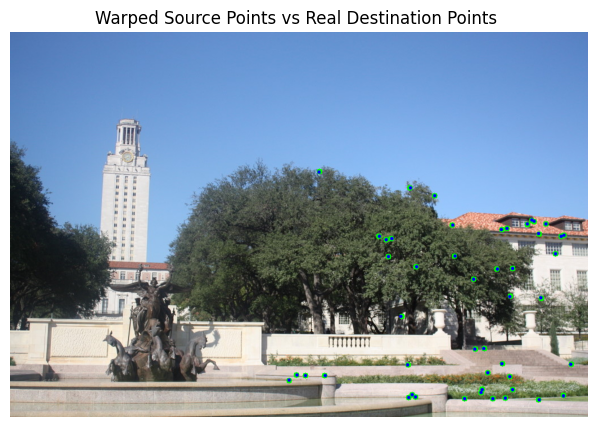

In [12]:
warped_pts = cv.perspectiveTransform(src_pts, H0)
img2_verify = imgs0[1].copy()
for pt in warped_pts:
    cv.circle(img2_verify, tuple(np.round(pt[0]).astype(int)), 5, (0, 255, 0), -1)
for pt in dst_pts:
    cv.circle(img2_verify, tuple(np.round(pt[0]).astype(int)), 3, (0, 0, 255), -1)
display_image(img2_verify, "Warped Source Points vs Real Destination Points ")

### Step 6: Warp One Image Onto the Other and Create Mosaic

Using the homography matrix, we warp one image onto the other and blend them together to form the mosaic.


In [13]:
def warp_images(img1, img2, H):
    h1, w1 = img1.shape[:2]
    h2, w2 = img2.shape[:2]
    corners_img1 = np.float32([[0,0],[0,h1],[w1,h1],[w1,0]]).reshape(-1,1,2)
    warped_corners = cv.perspectiveTransform(corners_img1, H)
    corners_img2 = np.float32([[0,0],[0,h2],[w2,h2],[w2,0]]).reshape(-1,1,2)

    all_corners = np.concatenate((warped_corners, corners_img2), axis=0)
    [xmin, ymin] = np.int32(all_corners.min(axis=0).ravel() - 0.5) #0.5 room for error (slight padding)
    [xmax, ymax] = np.int32(all_corners.max(axis=0).ravel() + 0.5)

    translation = [-xmin, -ymin] #shifting min to origin
    H_translation = np.array([[1, 0, translation[0]],
                              [0, 1, translation[1]],
                              [0, 0, 1]])

    result = cv.warpPerspective(img1, H_translation.dot(H), (xmax - xmin, ymax - ymin))
    result[translation[1]:translation[1]+h2, translation[0]:translation[0]+w2] = img2 #AAH

    return result

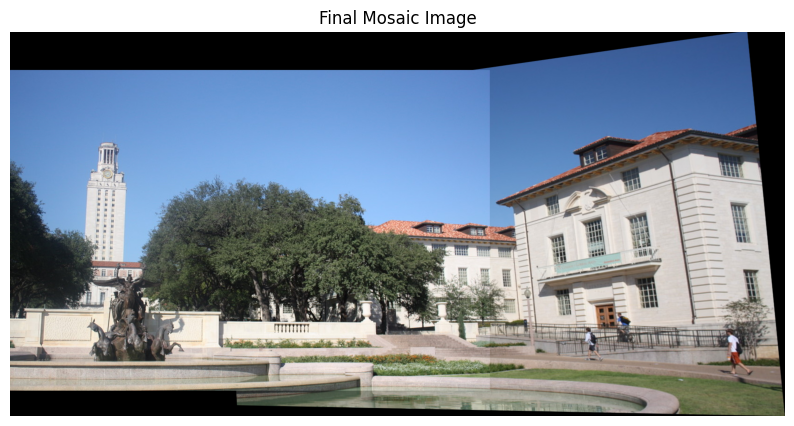

In [14]:
mosaic0 = warp_images(imgs0[0], imgs0[1], H0)
display_image(mosaic0, "Final Mosaic Image")

#### trying inpainting

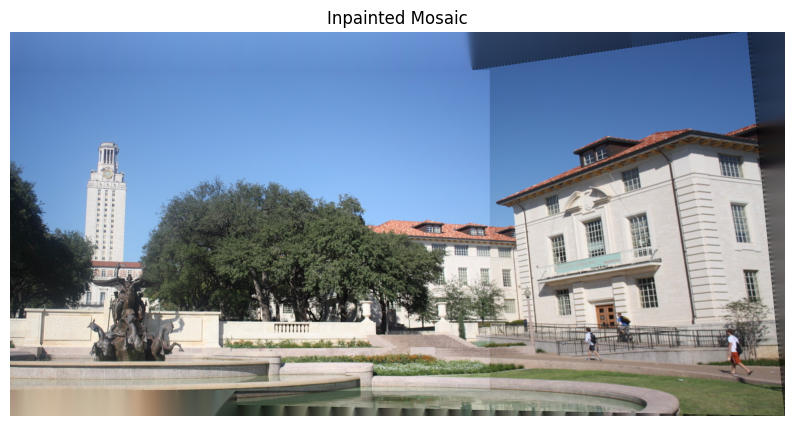

In [15]:
def inpaint_black_regions(image):
    # mask where pixels are black
    mask = cv.inRange(image, (0, 0, 0), (0, 0, 0))
    # inpainting using TELEA or NS method
    inpainted = cv.inpaint(image, mask, inpaintRadius=3, flags=cv.INPAINT_TELEA)
    return inpainted

inpainted_mosaic = inpaint_black_regions(mosaic0)
display_image(inpainted_mosaic, "Inpainted Mosaic")


### Step 7: Compare with OpenCV's Built-in Stitcher

Finally, we compare our manually created mosaic with OpenCV's built-in stitching function to see how well it performs.


successful stitching


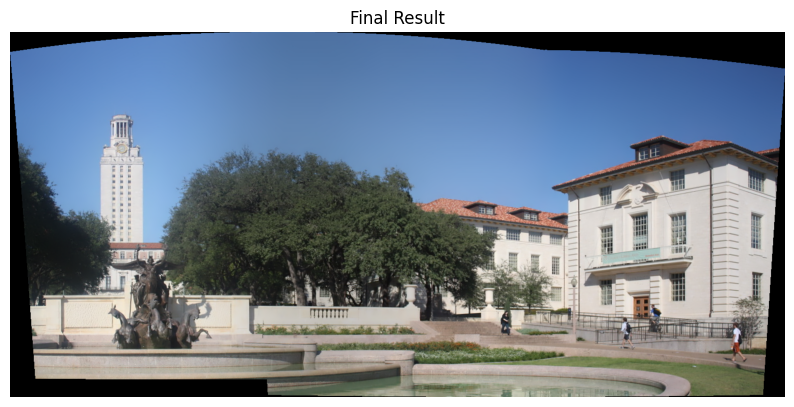

In [16]:
image_paths=['assets/stitching/pano_image1.jpg','assets/stitching/pano_image2.jpg'] 

imgs = [] 
for i in range(len(image_paths)): 
	imgs.append(cv.cvtColor(cv.imread(image_paths[i]), cv.COLOR_BGR2RGB))   

stitchy=cv.Stitcher.create() 
(dummy,output)=stitchy.stitch(imgs) 

if dummy != cv.STITCHER_OK: 
	print("stitching wasn't successful") 
else: 
	print('successful stitching') 

display_image(output, "Final Result")

--------------------------------------------------------

## **PART 2.2** | Image Stitching using 3 Images

same previously mentioned steps but this time done on 3 images

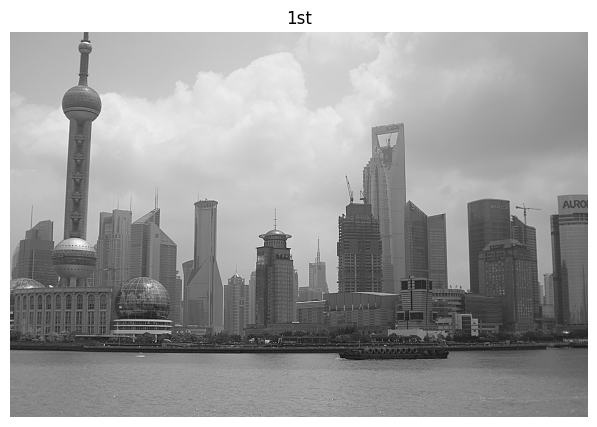

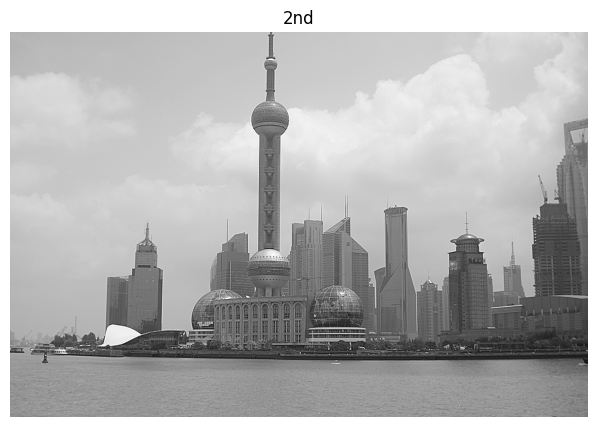

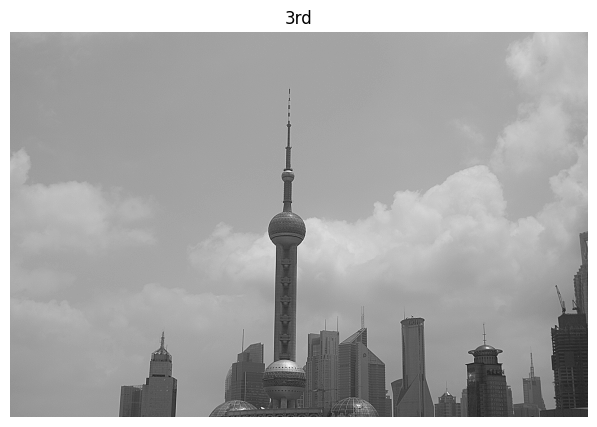

In [17]:
image_paths = ['assets/stitching/shanghai-23.png', 'assets/stitching/shanghai-21.png', 'assets/stitching/shanghai-22.png']

sharpening_kernel = np.array([[ 0, -1,  0],
                              [-1,  5, -1],
                              [ 0, -1,  0]])

images = []
gray_imgs_bonus = {}

# Loop through the image paths and process images
for i, path in enumerate(image_paths):
    img = cv.imread(path, cv.IMREAD_GRAYSCALE)  # Load the image as grayscale
    images.append(img)  # Append grayscale image to the list
    gray_imgs_bonus[i] = cv.filter2D(img, -1, sharpening_kernel)  # Apply sharpening and store in the dictionary

display_gray_image(gray_imgs_bonus[0], "1st")
display_gray_image(gray_imgs_bonus[1], "2nd")
display_gray_image(gray_imgs_bonus[2], "3rd")


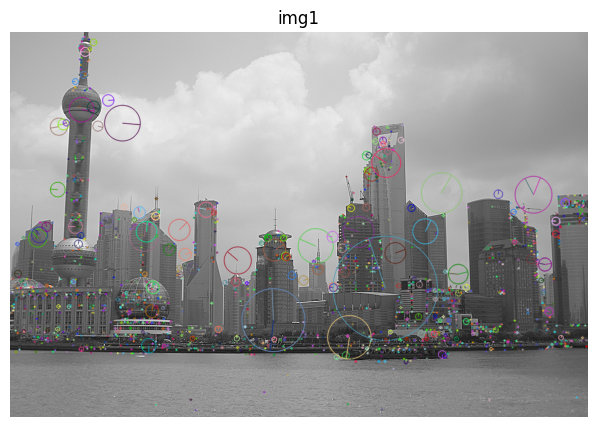

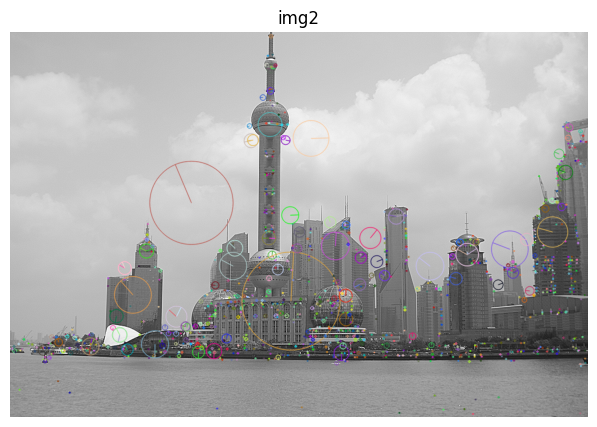

In [18]:
kp1, des1 = sift.detectAndCompute(gray_imgs_bonus[0], None) #SIFT works best on grayscale images
kp2, des2 = sift.detectAndCompute(gray_imgs_bonus[1], None)
img1 = cv.drawKeypoints(gray_imgs_bonus[0], kp1, gray_imgs_bonus[0].copy(), flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
img2 = cv.drawKeypoints(gray_imgs_bonus[1], kp2, gray_imgs_bonus[1].copy(), flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

display_image(img1, "img1")
display_image(img2, "img2")

In [19]:
matches = bf.knnMatch(des1,des2,k=2)
good = []
for m,n in matches:
    if m.distance < 0.19*n.distance:
        good.append([m])

good = sorted(good, key=lambda x: x[0].distance)[:50]


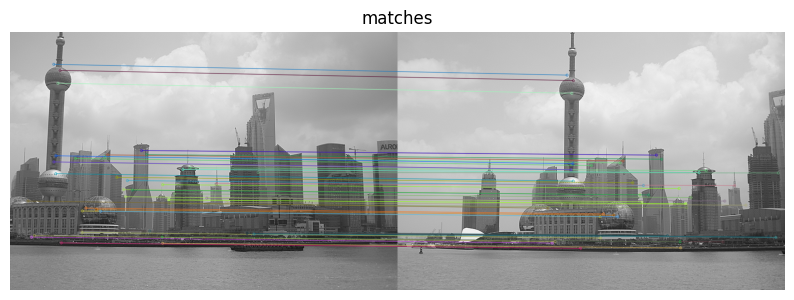

In [20]:
img3 = cv.drawMatchesKnn(gray_imgs_bonus[0],kp1,gray_imgs_bonus[1],kp2,good,None,flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
display_image(img3, "matches")

In [21]:
H, src_pts, dst_pts = ransac_homography(good, kp1, kp2)
print("Manual Homography Matrix:\n", H)


Manual Homography Matrix:
 [[ 8.89197114e-01  3.22652094e-02  3.37807672e+02]
 [-7.30686816e-02  9.57262739e-01  3.85059074e+01]
 [-1.08951204e-04 -4.08620232e-06  1.00000000e+00]]


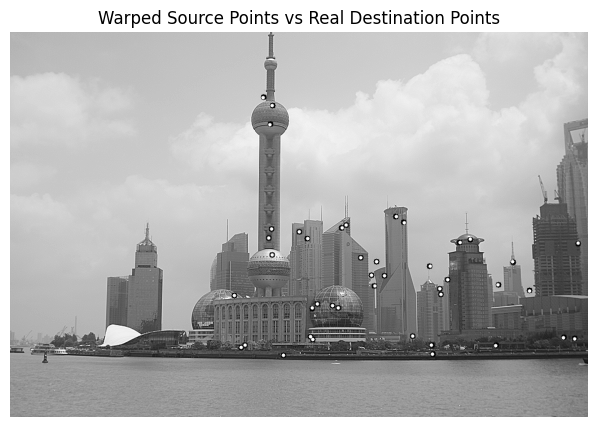

In [22]:
warped_pts = cv.perspectiveTransform(src_pts, H)
img2_verify = gray_imgs_bonus[1].copy()
for pt in warped_pts:
    cv.circle(img2_verify, tuple(np.round(pt[0]).astype(int)), 5, (0, 255, 0), -1)
for pt in dst_pts:
    cv.circle(img2_verify, tuple(np.round(pt[0]).astype(int)), 3, (255, 0, 0), -1)
display_gray_image(img2_verify, "Warped Source Points vs Real Destination Points")


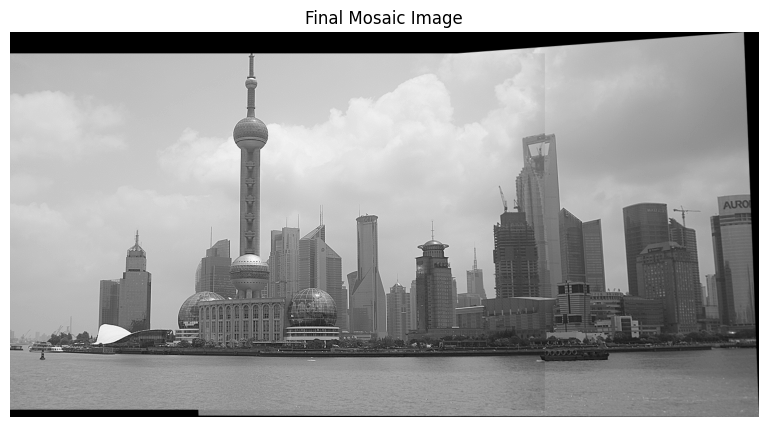

In [23]:
mosaic = warp_images(gray_imgs_bonus[0], gray_imgs_bonus[1], H)
display_gray_image(mosaic, "Final Mosaic Image")

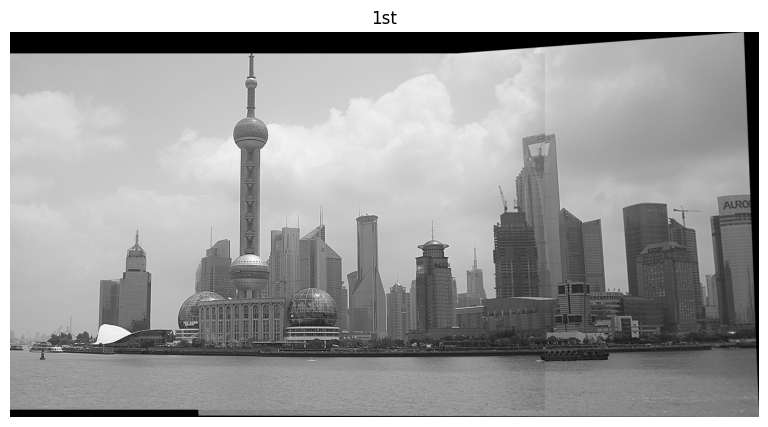

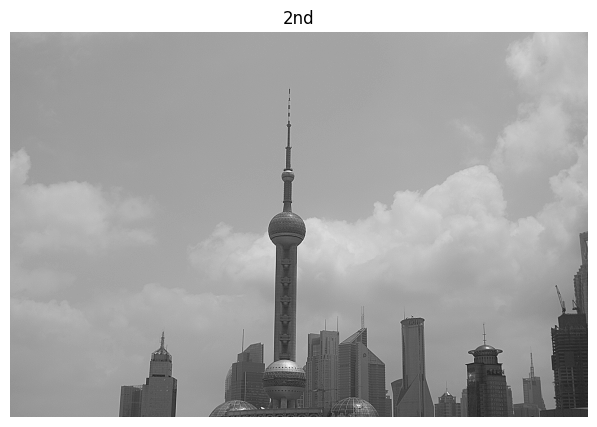

In [24]:
images2 = [mosaic, gray_imgs_bonus[2]]

display_gray_image(images2[0], "1st")
display_gray_image(images2[1], "2nd")

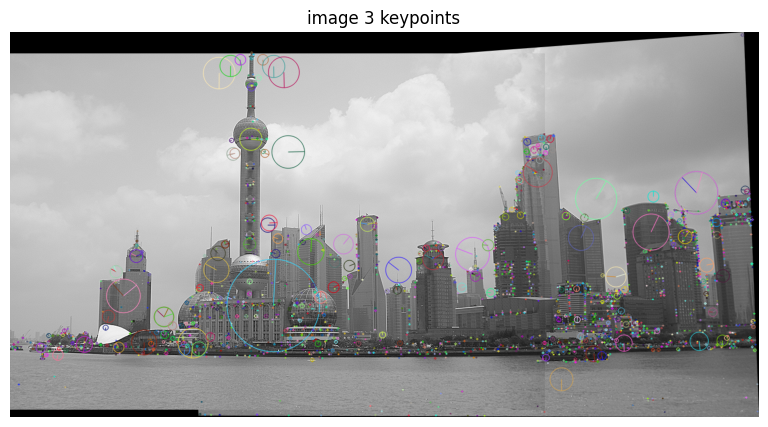

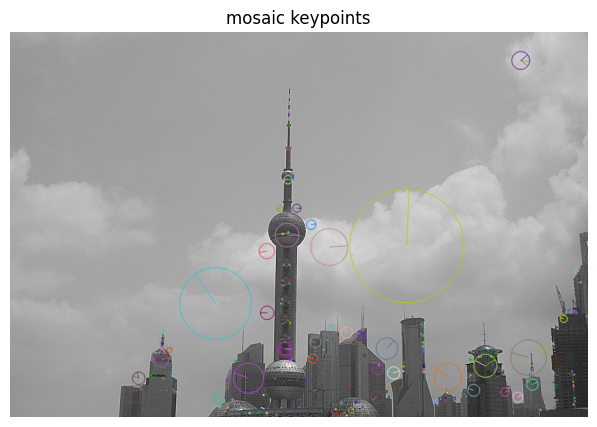

In [25]:
kp21, des21 = sift.detectAndCompute(images2[0], None) 
kp22, des22 = sift.detectAndCompute(images2[1], None)

img21 = cv.drawKeypoints(images2[0], kp21, images2[0].copy(), flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
img22 = cv.drawKeypoints(images2[1], kp22, images2[1].copy(), flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

display_gray_image(cv.drawKeypoints(images2[0], kp21, None, flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS), "image 3 keypoints")
display_gray_image(cv.drawKeypoints(images2[1], kp22, None, flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS), "mosaic keypoints")


In [26]:
matches2 = bf.knnMatch(des21,des22,k=2)

good2 = []
for m,n in matches2:
    if m.distance < 0.2*n.distance:
        good2.append([m])

good2 = sorted(good2, key=lambda x: x[0].distance)[:50]

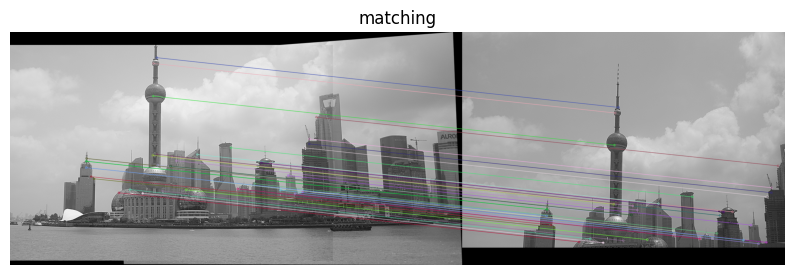

In [27]:
img23 = cv.drawMatchesKnn(images2[0],kp21,images2[1],kp22,good2,None,flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
display_image(img23, "matching")

In [28]:
H21, src_pts21, dst_pts21 = get_homography(good2, kp21, kp22)
print("Homography Matrix:\n", H21,"\n")

H22, src_pts22, dst_pts22 = ransac_homography(good2, kp21, kp22)
print("Manual Homography Matrix:\n", H22)


Homography Matrix:
 [[ 9.66607976e-01 -4.49590068e-02  4.42526933e+01]
 [-1.20268779e-03  9.37818160e-01  1.60004962e+02]
 [-1.02611227e-05 -7.58392468e-05  1.00000000e+00]] 

Manual Homography Matrix:
 [[ 9.64007815e-01 -4.67368528e-02  4.52864606e+01]
 [-1.93995746e-03  9.33306089e-01  1.61259583e+02]
 [-1.13668274e-05 -7.88018227e-05  1.00000000e+00]]


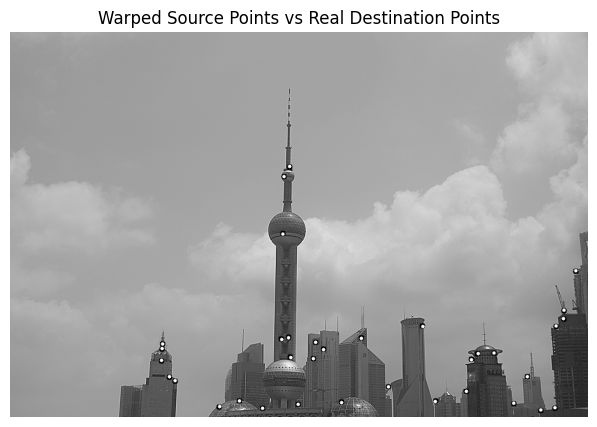

In [29]:
warped_pts = cv.perspectiveTransform(src_pts22, H22)
img2_verify = images2[1].copy()
for pt in warped_pts:
    cv.circle(img2_verify, tuple(np.round(pt[0]).astype(int)), 5, (0, 255, 0), -1)
for pt in dst_pts22:
    cv.circle(img2_verify, tuple(np.round(pt[0]).astype(int)), 3, (255, 0, 0), -1)
display_gray_image(img2_verify, "Warped Source Points vs Real Destination Points")


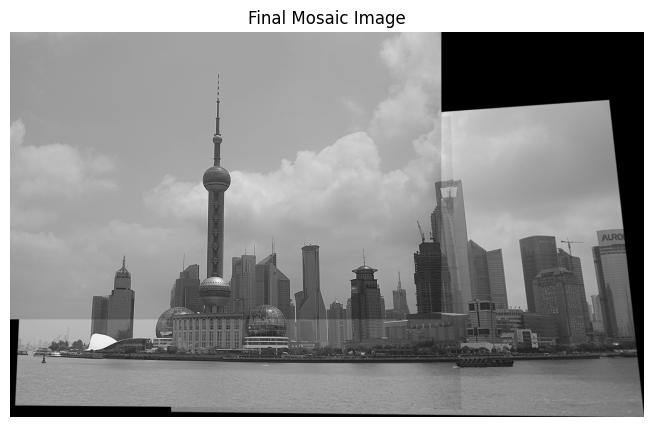

In [30]:
mosaic2 = warp_images(images2[0], images2[1], H22)
display_gray_image(mosaic2, "Final Mosaic Image")

In [31]:
def inpaint_grayscale_image(gray_img):
    # Convert grayscale to BGR to use inpaint()
    color_img = cv.cvtColor(gray_img, cv.COLOR_GRAY2BGR)

    # Create a mask for black pixels (0 intensity)
    mask = cv.inRange(color_img, (0, 0, 0), (0, 0, 0))

    # Apply inpainting
    inpainted_color = cv.inpaint(color_img, mask, 3, cv.INPAINT_TELEA)

    # Convert back to grayscale
    inpainted_gray = cv.cvtColor(inpainted_color, cv.COLOR_BGR2GRAY)
    return inpainted_gray


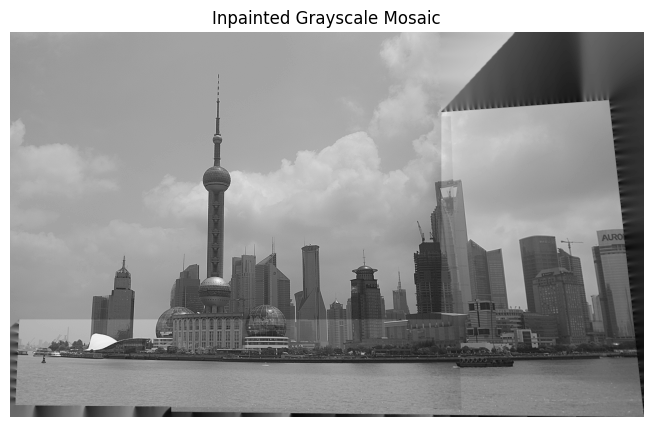

In [32]:
inpainted = inpaint_grayscale_image(mosaic2)
display_gray_image(inpainted, "Inpainted Grayscale Mosaic")


---------------------------------------------------------------

## Changing Order

In [33]:
image_paths = ['assets/stitching/shanghai-21.png', 'assets/stitching/shanghai-22.png', 'assets/stitching/shanghai-23.png']

sharpening_kernel = np.array([[ 0, -1,  0],
                              [-1,  5, -1],
                              [ 0, -1,  0]])

images = []
gray_imgs_bonus = {}

# Loop through the image paths and process images
for i, path in enumerate(image_paths):
    img = cv.imread(path, cv.IMREAD_GRAYSCALE)  # Load the image as grayscale
    images.append(img)  # Append grayscale image to the list
    gray_imgs_bonus[i] = cv.filter2D(img, -1, sharpening_kernel)  # Apply sharpening and store in the dictionary


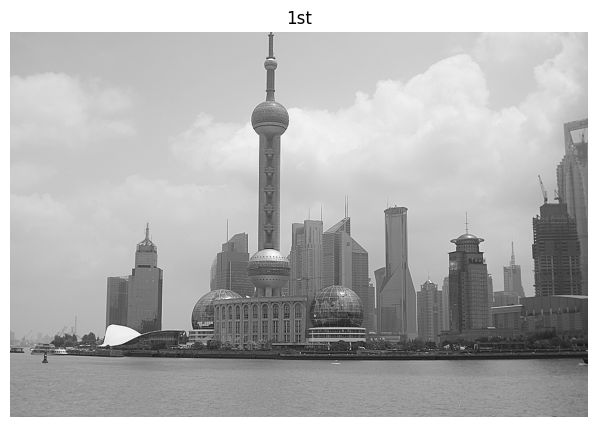

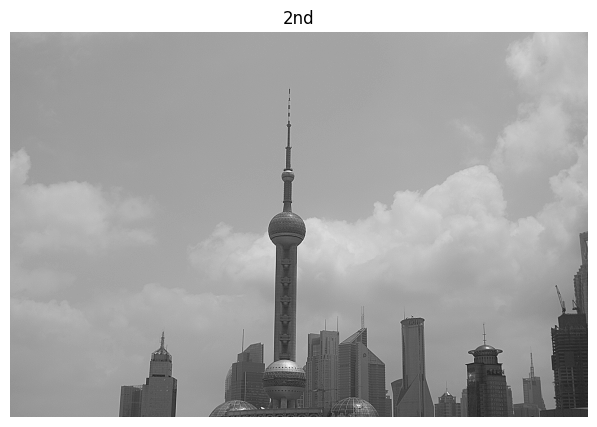

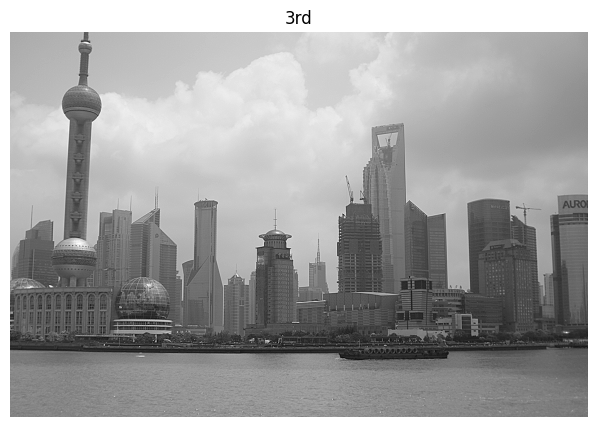

In [34]:
display_gray_image(gray_imgs_bonus[0], "1st")
display_gray_image(gray_imgs_bonus[1], "2nd")
display_gray_image(gray_imgs_bonus[2], "3rd")

In [35]:
kp1, des1 = sift.detectAndCompute(gray_imgs_bonus[0], None) #SIFT works best on grayscale images
kp2, des2 = sift.detectAndCompute(gray_imgs_bonus[1], None)
img1 = cv.drawKeypoints(gray_imgs_bonus[0], kp1, gray_imgs_bonus[0].copy(), flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
img2 = cv.drawKeypoints(gray_imgs_bonus[1], kp2, gray_imgs_bonus[1].copy(), flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

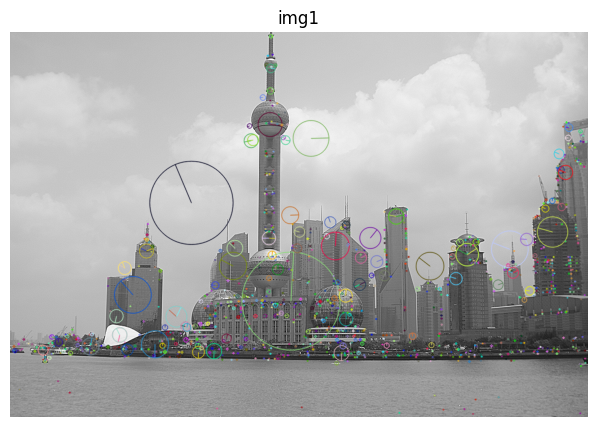

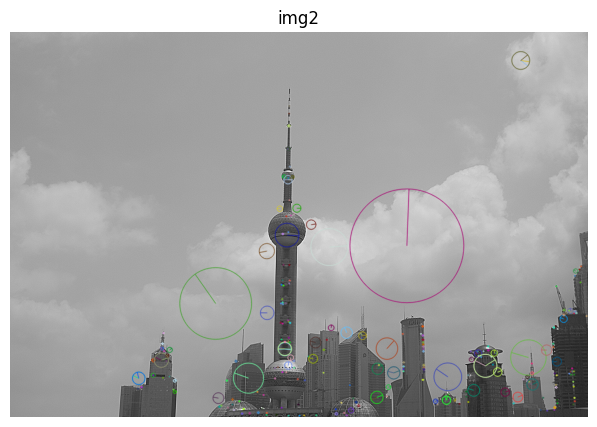

In [36]:
display_image(img1, "img1")
display_image(img2, "img2")

In [37]:
matches = bf.knnMatch(des1,des2,k=2)
good = []
for m,n in matches:
    if m.distance < 0.19*n.distance:
        good.append([m])

good = sorted(good, key=lambda x: x[0].distance)[:50]


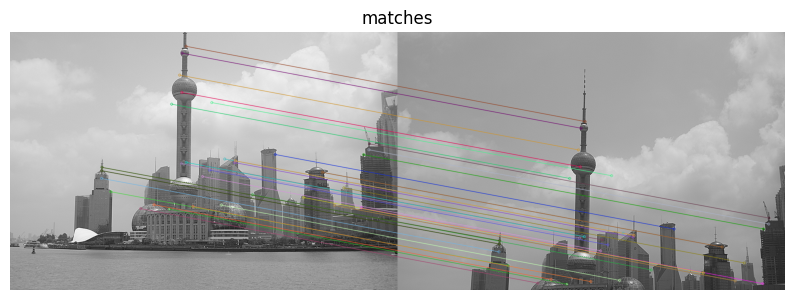

In [38]:
img3 = cv.drawMatchesKnn(gray_imgs_bonus[0],kp1,gray_imgs_bonus[1],kp2,good,None,flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
display_image(img3, "matches")

In [39]:
H, src_pts, dst_pts = ransac_homography(good, kp1, kp2)
print("Manual Homography Matrix:\n", H)


Manual Homography Matrix:
 [[ 9.69223112e-01 -4.54801574e-02  4.28144053e+01]
 [-1.83646856e-03  9.39038604e-01  2.00077873e+02]
 [-1.09075891e-05 -7.54176594e-05  1.00000000e+00]]


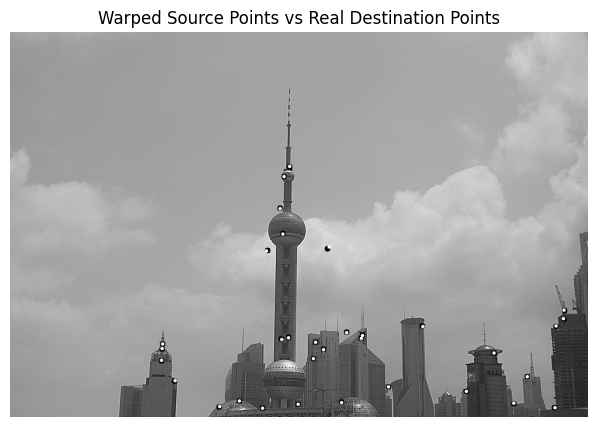

In [40]:
warped_pts = cv.perspectiveTransform(src_pts, H)
img2_verify = gray_imgs_bonus[1].copy()
for pt in warped_pts:
    cv.circle(img2_verify, tuple(np.round(pt[0]).astype(int)), 5, (0, 255, 0), -1)
for pt in dst_pts:
    cv.circle(img2_verify, tuple(np.round(pt[0]).astype(int)), 3, (255, 0, 0), -1)
display_gray_image(img2_verify, "Warped Source Points vs Real Destination Points")


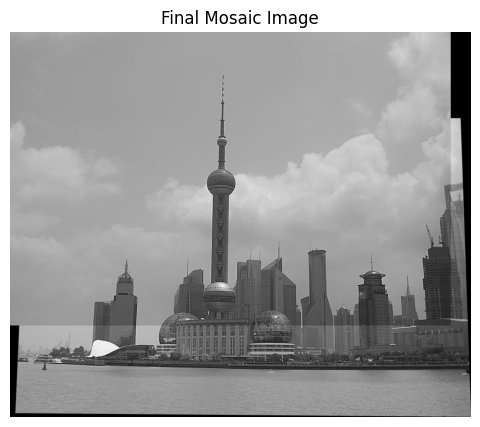

In [41]:
mosaic = warp_images(gray_imgs_bonus[0], gray_imgs_bonus[1], H)
display_gray_image(mosaic, "Final Mosaic Image")

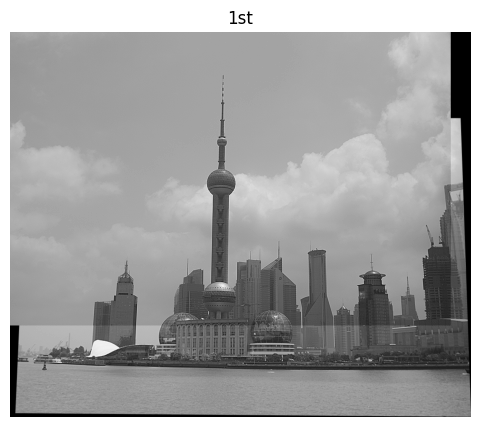

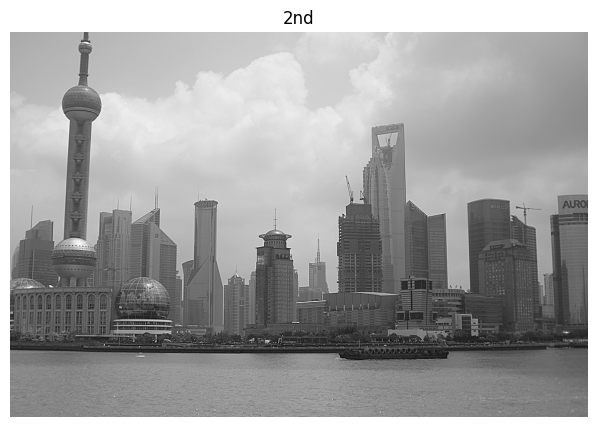

In [42]:
images2 = [mosaic, gray_imgs_bonus[2]]

display_gray_image(images2[0], "1st")
display_gray_image(images2[1], "2nd")

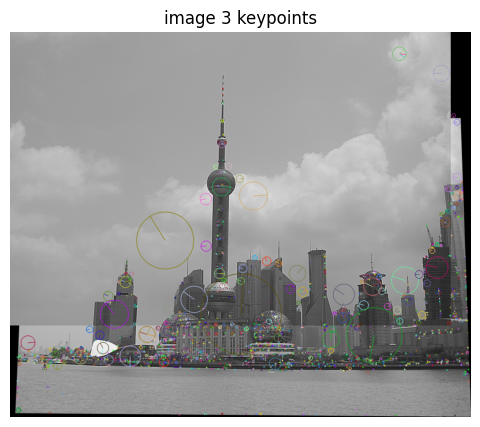

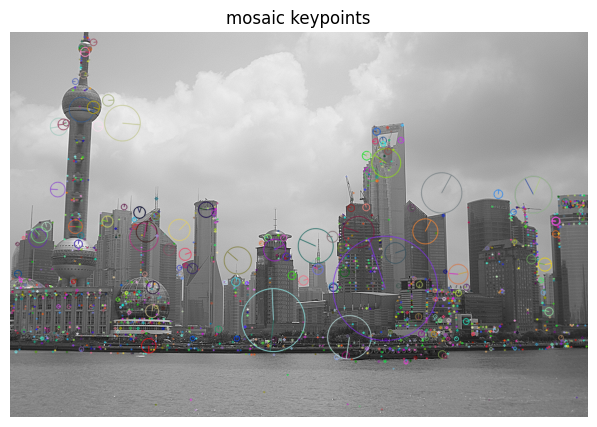

In [43]:
kp21, des21 = sift.detectAndCompute(images2[0], None) 
kp22, des22 = sift.detectAndCompute(images2[1], None)

img21 = cv.drawKeypoints(images2[0], kp21, images2[0].copy(), flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
img22 = cv.drawKeypoints(images2[1], kp22, images2[1].copy(), flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

display_gray_image(cv.drawKeypoints(images2[0], kp21, None, flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS), "image 3 keypoints")
display_gray_image(cv.drawKeypoints(images2[1], kp22, None, flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS), "mosaic keypoints")


In [44]:
matches2 = bf.knnMatch(des21,des22,k=2)

good2 = []
for m,n in matches2:
    if m.distance < 0.2*n.distance:
        good2.append([m])

good2 = sorted(good2, key=lambda x: x[0].distance)[:50]

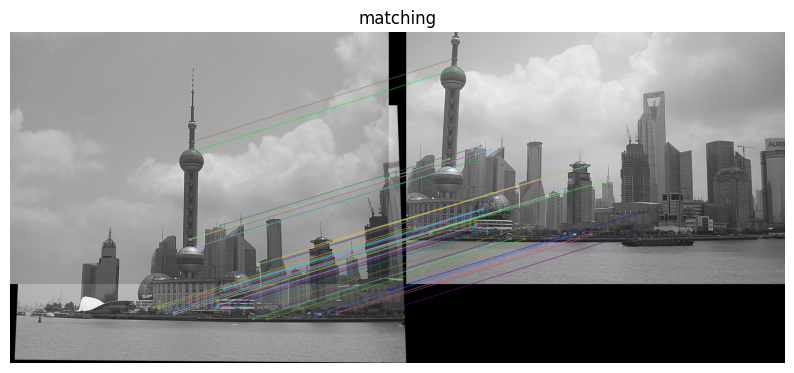

In [45]:
img23 = cv.drawMatchesKnn(images2[0],kp21,images2[1],kp22,good2,None,flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
display_image(img23, "matching")

In [46]:
H21, src_pts21, dst_pts21 = get_homography(good2, kp21, kp22)
print("Homography Matrix:\n", H21,"\n")

H22, src_pts22, dst_pts22 = ransac_homography(good2, kp21, kp22)
print("Manual Homography Matrix:\n", H22)


Homography Matrix:
 [[ 1.18860836e+00 -1.47561174e-02 -4.40346309e+02]
 [ 8.66602416e-02  1.17465967e+00 -3.14276020e+02]
 [ 1.46152757e-04  9.21236012e-05  1.00000000e+00]] 

Manual Homography Matrix:
 [[ 1.17518467e+00 -2.16234097e-02 -4.30222541e+02]
 [ 8.50362786e-02  1.15698250e+00 -3.06844894e+02]
 [ 1.42945875e-04  7.77041980e-05  1.00000000e+00]]


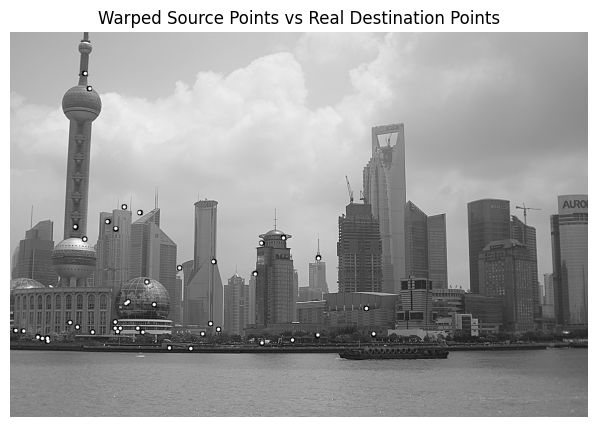

In [47]:
warped_pts = cv.perspectiveTransform(src_pts22, H22)
img2_verify = images2[1].copy()
for pt in warped_pts:
    cv.circle(img2_verify, tuple(np.round(pt[0]).astype(int)), 5, (0, 255, 0), -1)
for pt in dst_pts22:
    cv.circle(img2_verify, tuple(np.round(pt[0]).astype(int)), 3, (255, 0, 0), -1)
display_gray_image(img2_verify, "Warped Source Points vs Real Destination Points")


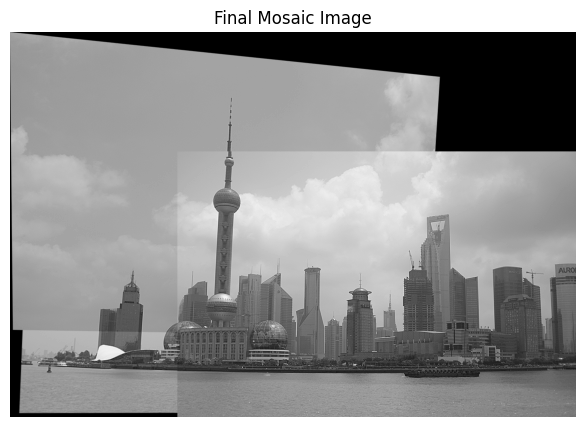

In [48]:
mosaic2 = warp_images(images2[0], images2[1], H22)
display_gray_image(mosaic2, "Final Mosaic Image")

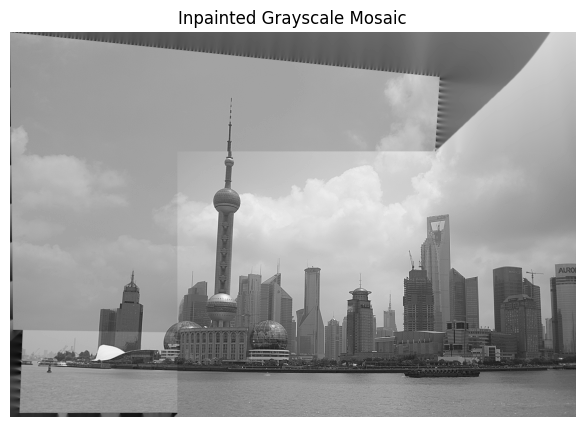

In [49]:
inpainted = inpaint_grayscale_image(mosaic2)
display_gray_image(inpainted, "Inpainted Grayscale Mosaic")


successful


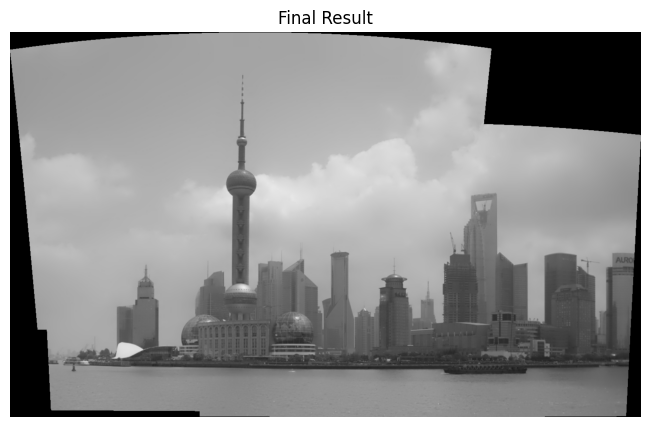

In [50]:
import cv2 
image_paths=['assets/stitching/shanghai-21.png','assets/stitching/shanghai-22.png', 'assets/stitching/shanghai-23.png'] 

imgs = [] 
for i in range(len(image_paths)): 
	imgs.append(cv2.imread(image_paths[i])) 

stitchy=cv2.Stitcher.create() 
(dummy,output)=stitchy.stitch(imgs) 

if dummy != cv2.STITCHER_OK: 
	print("stitching wasn't successful") 
else: 
	print('successful') 
# for i in range(len(image_paths)):
    # display_image(cv2.cvtColor(cv2.imread(image_paths[i]), cv2.COLOR_BGR2RGB), f"Image {i+1}")
display_image(output, "Final Result")



---------------------------------------------------------------

## **Final Function to be used**

In [82]:
def stitch_images(image_paths):
    imgs0 = [] 
    gray_imgs = []
    for i in range(len(image_paths)): 
        img = cv.imread(image_paths[i])
        imgs0.append(cv.cvtColor(img, cv.COLOR_BGR2RGB)) 
        gray_imgs.append(cv.cvtColor(img, cv.COLOR_BGR2GRAY)) 

    img1 = imgs0[0]
    img2 = imgs0[1]

    sift = cv.SIFT_create()
    kp1, des1 = sift.detectAndCompute(gray_imgs[0], None)
    kp2, des2 = sift.detectAndCompute(gray_imgs[1], None)

    bf = cv.BFMatcher()
    matches = bf.knnMatch(des1, des2, k=2)
    good = []
    for m, n in matches:
        if m.distance < 0.5 * n.distance:
            good.append([m])
    good = sorted(good, key=lambda x: x[0].distance)[:50]

    if len(good) < 4:
        raise ValueError("Not enough good matches to compute homography.")

    src_pts = np.float32([kp1[m[0].queryIdx].pt for m in good])
    dst_pts = np.float32([kp2[m[0].trainIdx].pt for m in good])

    A = []
    for i in range(len(src_pts)):
        x, y = src_pts[i]
        x_dash, y_dash = dst_pts[i]
        A.append([-x, -y, -1,  0,  0, 0, x * x_dash, y * x_dash, x_dash])
        A.append([ 0,  0, 0, -x, -y, -1, x * y_dash, y * y_dash, y_dash])
    A = np.array(A)
    _, _, Vt = np.linalg.svd(A)
    H = Vt[-1].reshape(3, 3)
    H = H / H[2, 2]

    h1, w1 = img1.shape[:2]
    h2, w2 = img2.shape[:2]
    corners_img1 = np.float32([[0,0], [0,h1], [w1,h1], [w1,0]]).reshape(-1,1,2)
    warped_corners = cv.perspectiveTransform(corners_img1, H)
    corners_img2 = np.float32([[0,0], [0,h2], [w2,h2], [w2,0]]).reshape(-1,1,2)

    all_corners = np.concatenate((warped_corners, corners_img2), axis=0)
    [xmin, ymin] = np.int32(all_corners.min(axis=0).ravel() - 0.5)
    [xmax, ymax] = np.int32(all_corners.max(axis=0).ravel() + 0.5)

    translation = [-xmin, -ymin]
    H_translation = np.array([[1, 0, translation[0]],
                              [0, 1, translation[1]],
                              [0, 0, 1]])

    result = cv.warpPerspective(img1, H_translation.dot(H), (xmax - xmin, ymax - ymin))
    result[translation[1]:translation[1]+h2, translation[0]:translation[0]+w2] = img2

    return result
    # if len(result.shape) == 3:
    #     mask = cv.inRange(result, (0, 0, 0), (0, 0, 0))
    # else:
    #     mask = cv.inRange(result, 0, 0)

    # inpainted = cv.inpaint(result, mask, inpaintRadius=3, flags=cv.INPAINT_TELEA)
    # return inpainted


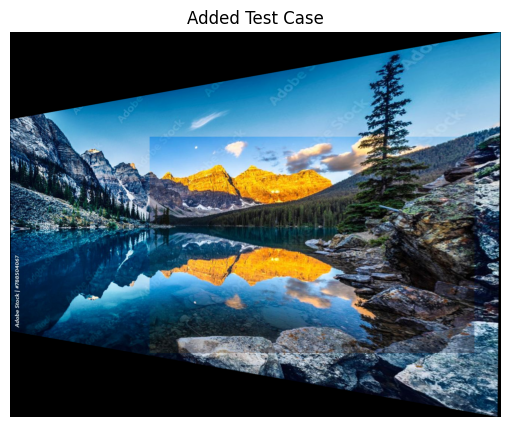

In [84]:
display_image(stitch_images(['assets/stitching/nat2.jpg','assets/stitching/nat3.jpg']) , "Added Test Case")

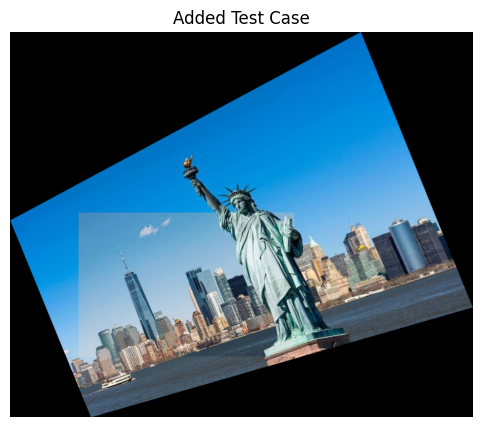

In [88]:
img1 = display_image(stitch_images(['assets/stitching/ny1.jpg','assets/stitching/ny3.jpg']) , "Added Test Case")

Resources:
- https://medium.com/@navekshasood/image-stitching-to-create-a-panorama-5e030ecc8f7
- https://docs.opencv.org/4.x/da/df5/tutorial_py_sift_intro.html
- https://docs.opencv.org/4.x/dc/dc3/tutorial_py_matcher.html
- https://kushalvyas.github.io/stitching.html
